In [13]:
import networkx as nx
import numpy as np
import neuraltda.topology as top 
import neuraltda.build_space as bs
import neuraltda.H_MDS as hmds
import h5py as h5
import matplotlib.pyplot as plt
from scipy.io import savemat
%matplotlib inline
reload(bs)
reload(nx)
reload(hmds)

<module 'neuraltda.H_MDS' from '/Users/brad/GentnerLab/code/NeuralTDA/neuraltda/H_MDS.pyc'>

In [18]:
bdf = '/Volumes/gentner/btheilma/experiments/B1235/phy051316/Pen01_Lft_AP200_ML800__Site01_Z2200__B1235_cat_P01_S01_1/binned_data/0727161221/B1235_cat_P01_S01_1-good-50ms-stim.binned'
bdf = '/Users/brad/test_binned_data/B1235_cat_P01_S01_1-good-50ms-stim.binned'

In [9]:
global alogf 
top.alogf = './test_grph.log'
with h5.File(bdf, 'r') as f:
    
    bds = f['B_scaled_burung']['0']
    graph = bs.build_graph_from_binned_dataset(bds, 6.0)
    cgs = top.calc_cell_groups_from_binned_data(bds, 6.0)

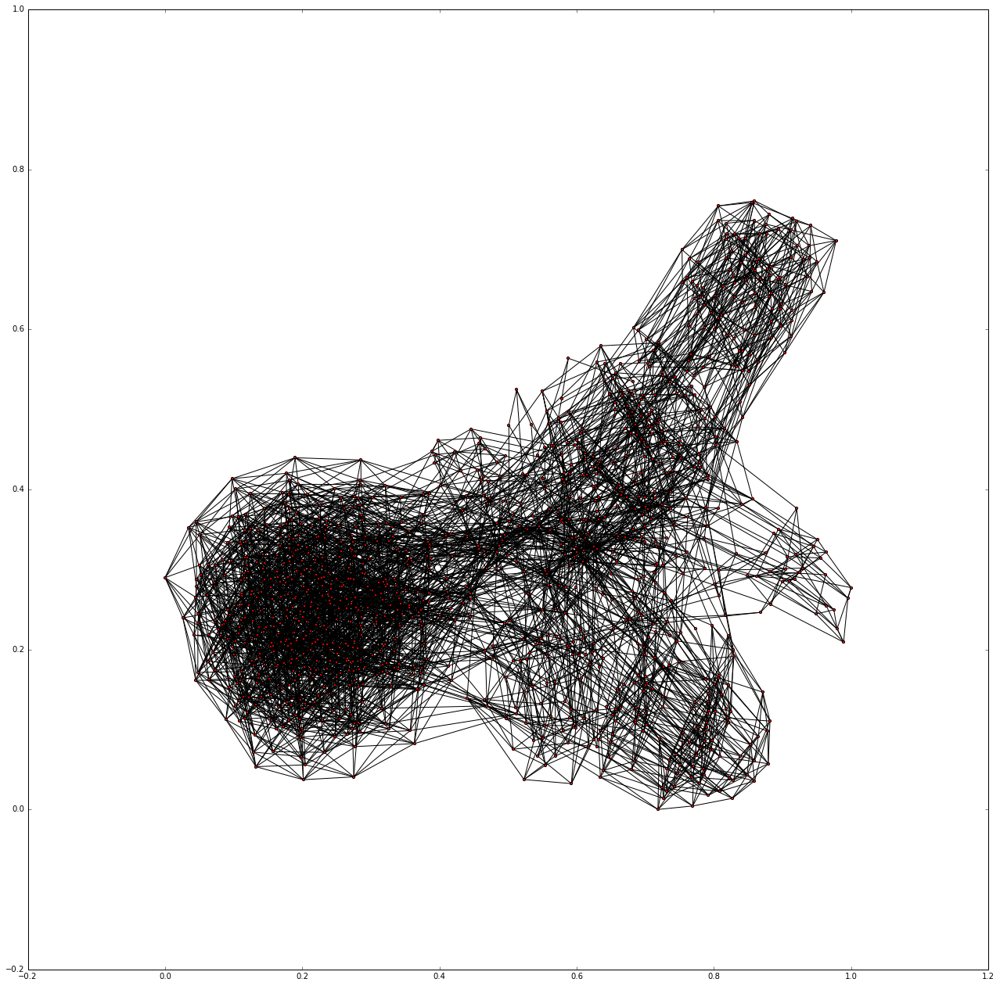

In [11]:
plt.figure(figsize=(22,22))
pos = nx.spring_layout(graph, dim=2)
nx.draw_networkx(graph, pos=pos, node_size=10, with_labels=False)
plt.show()

In [ ]:
global alogf 
top.alogf = './test_grph.log'
with h5.File(bdf, 'r') as f:
    for stim in f.keys():
        bds = f[stim]['0']
        graph = bs.build_graph_from_binned_dataset(bds, 6.0)
        plt.figure()
        pos = nx.spring_layout(graph, dim=2)
        nx.draw_networkx(graph, pos=pos, node_size=10, with_labels=False)
        plt.show()

In [ ]:
global alogf 
top.alogf = './test_grph.log'
with h5.File(bdf, 'r') as f:
    
    bds = f['A_scaled_burung']['0']
    cgs = top.calc_cell_groups_from_binned_data(bds, 6.0)

In [ ]:
g1 = bs.build_graph_from_cell_groups_incremental(cgs, 90)


In [ ]:
nx.draw(g1)

In [ ]:
pos = nx.spring_layout(g1, dim=2)
nx.draw_networkx(g1, pos=pos, node_size=10, with_labels=False)

In [ ]:
gq = bs.compute_gamma_q(g1)

In [ ]:
test_cgs = [[1, [1]], [2, [1,2]], [3, [1,2,3]], [4, [2,3]], [5, [2,3,4]]]

In [ ]:
g2 = bs.build_graph_from_cell_groups(test_cgs)

In [ ]:
nx.draw_networkx(g2)

In [ ]:
gq = bs.compute_gamma_q(g2)
nx.draw_networkx(gq)

In [ ]:
g1.edges(['6', '610'], data='name')

In [ ]:
gq.nodes()

In [ ]:
nx.non_edges(gq)

In [ ]:
nx.cycle_basis(gq)

In [ ]:
nx.draw_networkx(gq)

In [ ]:
nx.find_cycle(gq, source='223')

In [ ]:
cgconcat = bs.concatenate_all_trial_cell_groups(bdf, 'A_scaled_burung', 6.0)
gconcat = bs.build_graph_from_cell_groups(cgconcat)

In [ ]:
pos = nx.spring_layout(gconcat)
plt.figure(figsize=(22,22))
nx.draw_networkx(graph, pos=pos, node_size=50, with_labels=False)
plt.show()

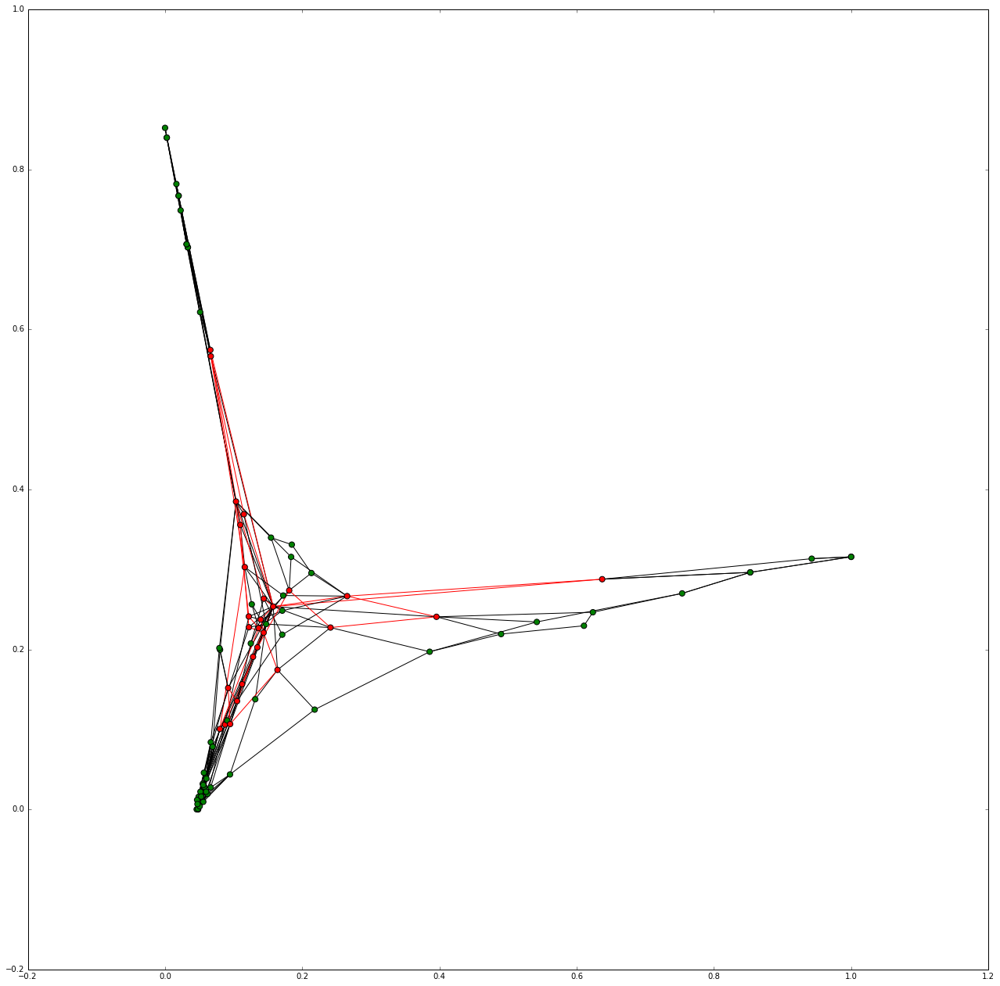

In [78]:
plt.close("all")
global alogf 
top.alogf = './test_grph.log'
with h5.File(bdf, 'r') as f:
    
    bds = f['B_scaled_burung']['1']
    graph = bs.build_graph_from_binned_dataset(bds, 6.0)
    cgs = top.calc_cell_groups_from_binned_data(bds, 6.0)

cg_traj = bs.get_cell_group_trajectory(cgs)
pos = nx.spectral_layout(graph)
green_nodes = [(s in cg_traj) for s in graph.nodes()]
green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
nodecolors = [('r' if s else 'g') for s in green_nodes]
edgecolors = [('r' if (s in green_edges or s[::-1] in green_edges) else 'k') for s in graph.edges()]

plt.figure(figsize=(22,22))
nx.draw_networkx(graph, pos=pos, edge_color=edgecolors, node_color=nodecolors, node_size=50, with_labels=False)
plt.show()

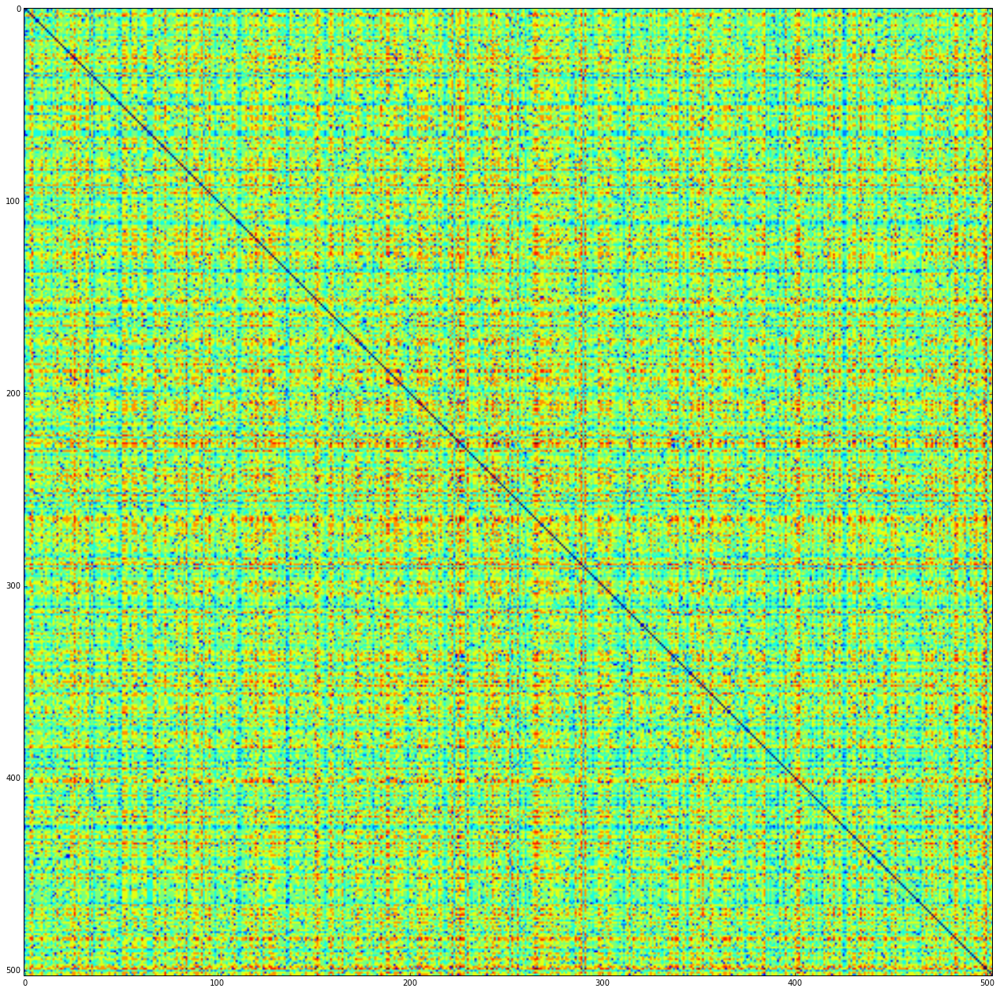

In [19]:
plt.close("all")
global alogf 
top.alogf = './test_grph.log'

tau = 0.05
with h5.File(bdf, 'r') as f:
    nclus = f.attrs['nclus']
    bds = f['A_scaled_burung']['11']

    cgs = top.calc_cell_groups_from_binned_data(bds, 6.0)
    graph = bs.build_metric_graph_from_cell_groups(cgs, nclus, tau)

    
distances = nx.all_pairs_dijkstra_path_length(graph)
nverts = graph.number_of_nodes()
dmat = np.zeros((nverts, nverts))
for n1, key1 in enumerate(graph.nodes()):
    dat = distances[key1]
    for n2, key2 in enumerate(graph.nodes()):
        
        dmat[n1, n2] = dat[key2]
        
savemat('/Users/brad/test_binned_data/dmat.mat', {'dmat':dmat})

with open('/Users/brad/test_binned_data/distmat.dat', 'wb') as f:
    dmat.tofile(f)

plt.figure(figsize=(22,22))
plt.imshow(dmat)

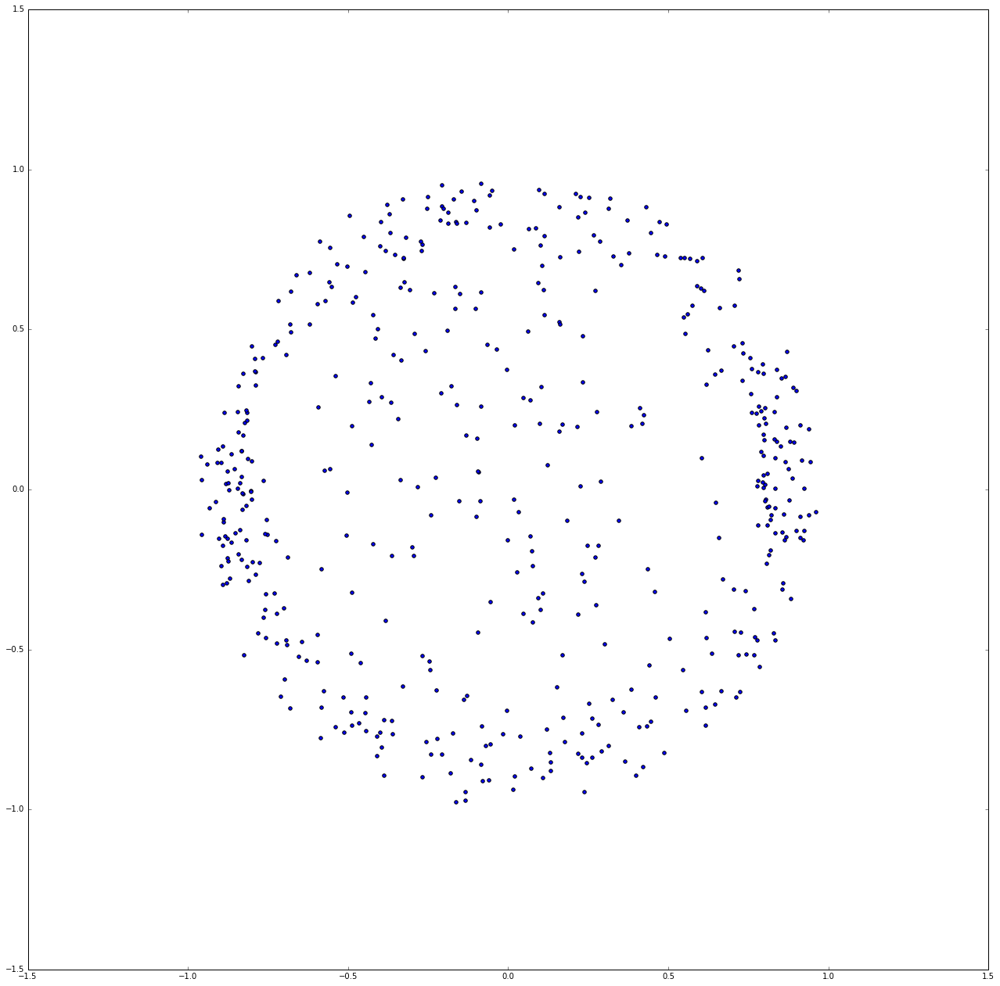

In [22]:
resfile = '/Users/brad/test_binned_data/dmat_out.dat'
c_embed = np.fromfile(resfile)
embed = c_embed[0::2] +1j*c_embed[1::2]
plt.figure(figsize=(22,22))
plt.scatter(np.real(embed), np.imag(embed))


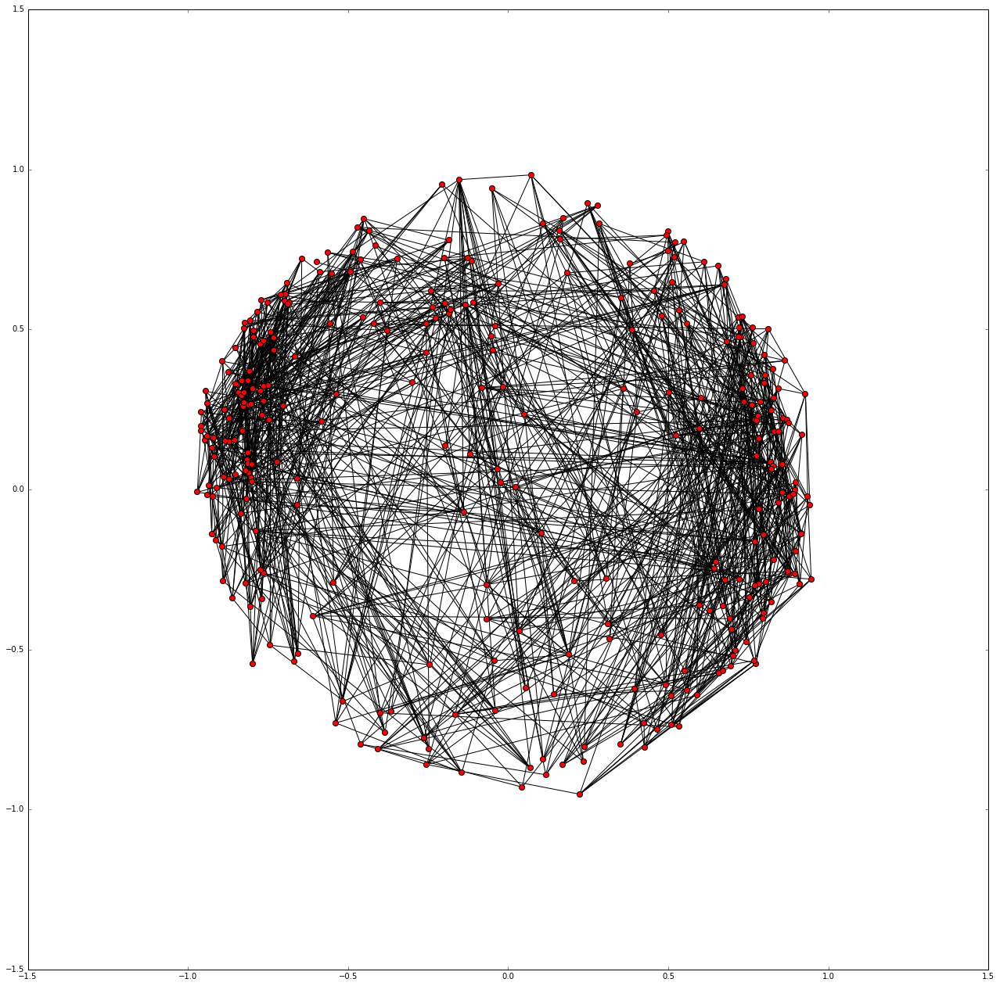

In [20]:
cg_traj = bs.get_cell_group_trajectory(cgs)
green_nodes = [(s in cg_traj) for s in graph.nodes()]
green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
nodecolors = [('r' if s else 'g') for s in green_nodes]
edgecolors = [('r' if (s in green_edges or s[ ::-1] in green_edges) else 'k') for s in graph.edges()]
plt.figure(figsize=(22,22))
nx.draw_networkx(graph, pos=pos,node_size=50, with_labels=False)
plt.show()

Embedding...


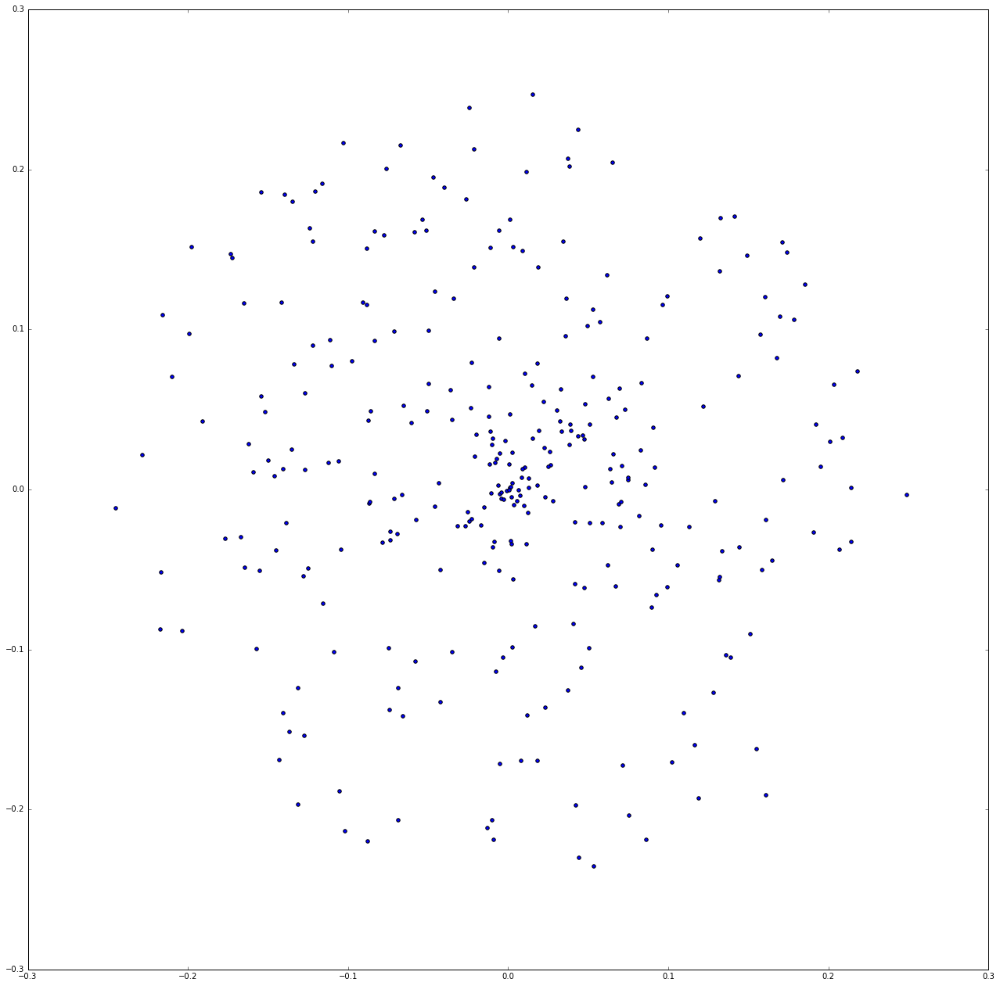

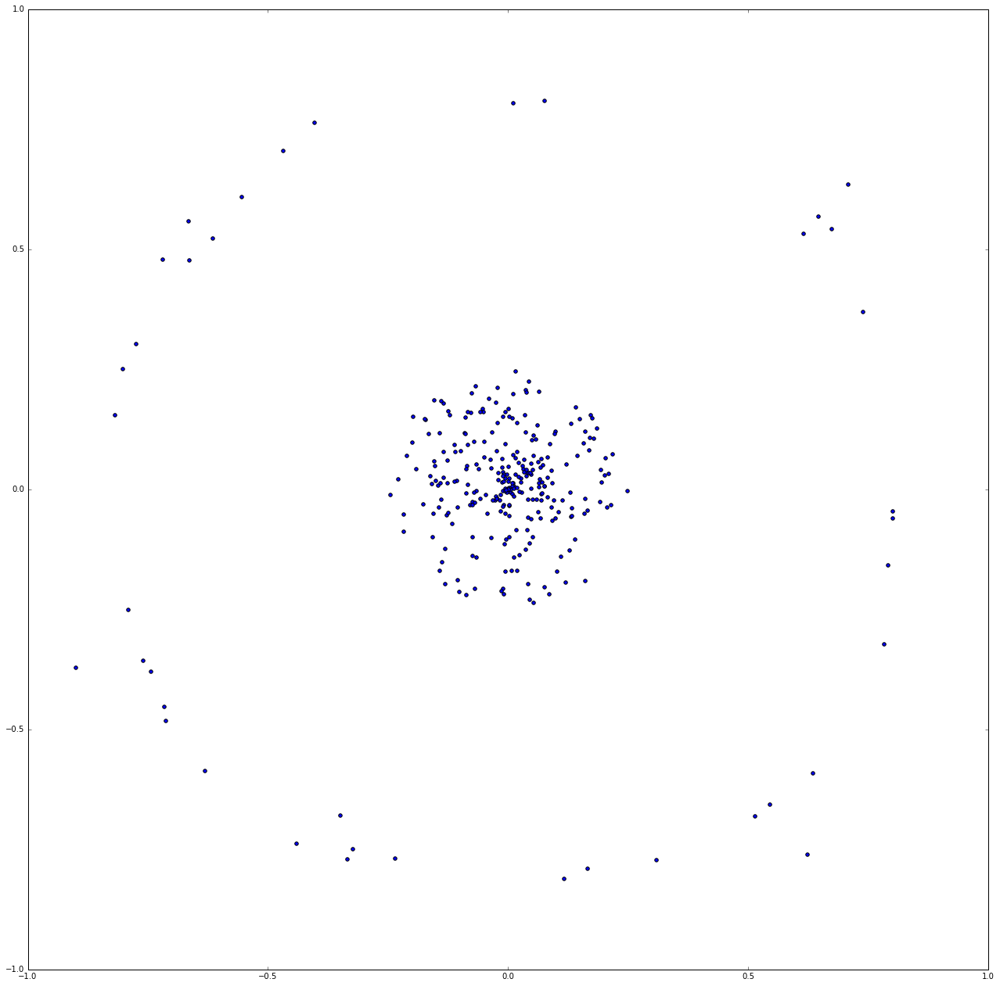

In [7]:
# use HMDS to embed
print('Embedding...')

r = np.random.uniform(high = 0.25, size=nverts)
thet = np.random.uniform(high=2*np.pi, size=nverts)
pts = np.multiply(r, np.exp(1j*thet))
X = np.real(pts)
Y = np.imag(pts)              
plt.figure(figsize=(22,22))
plt.scatter(X, Y)
w = np.ones((nverts, nverts))
wtot = 0.5*np.sum(np.sum(dmat))
w = np.power(dmat+np.diag(np.ones(nverts)), -1)/wtot
w = w - np.diag(np.diag(w))
eta = 0.1
eps = 1e-4
H_embed = hmds.fit_HMDS(X, Y, dmat, w, eta, eps, verbose=False)
plt.figure(figsize=(22,22))
plt.scatter(np.real(H_embed), np.imag(H_embed))

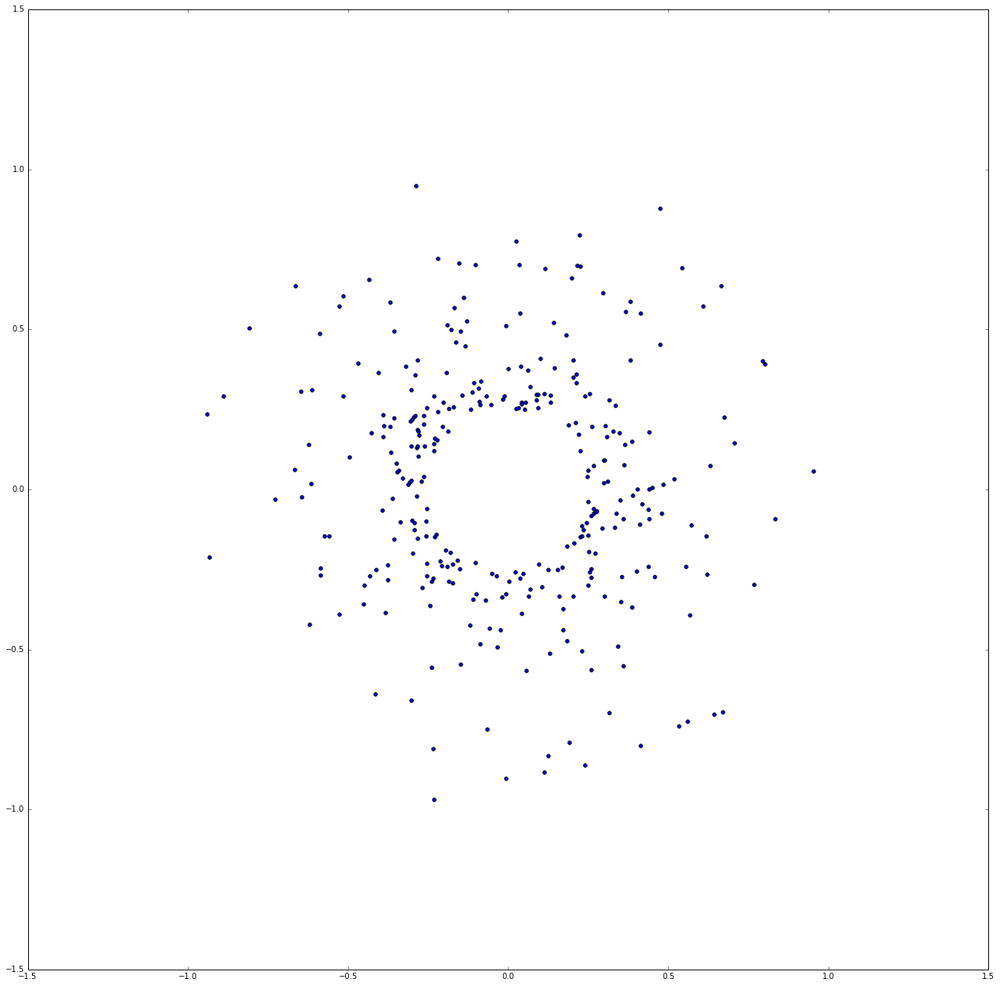

In [13]:
X = np.random.randn(nverts)
Y = np.random.randn(nverts)
mag = np.multiply(np.random.uniform(1, 4, size=nverts), np.abs(X+1j*Y))
X = np.divide(X, mag)
Y = np.divide(Y, mag)

plt.figure(figsize=(22,22))
plt.scatter(X, Y)

In [9]:
delt = hmds.test_delta_hyperbolic(dmat)

KeyboardInterrupt: 

Embedding...


NameError: global name 'hmds' is not defined

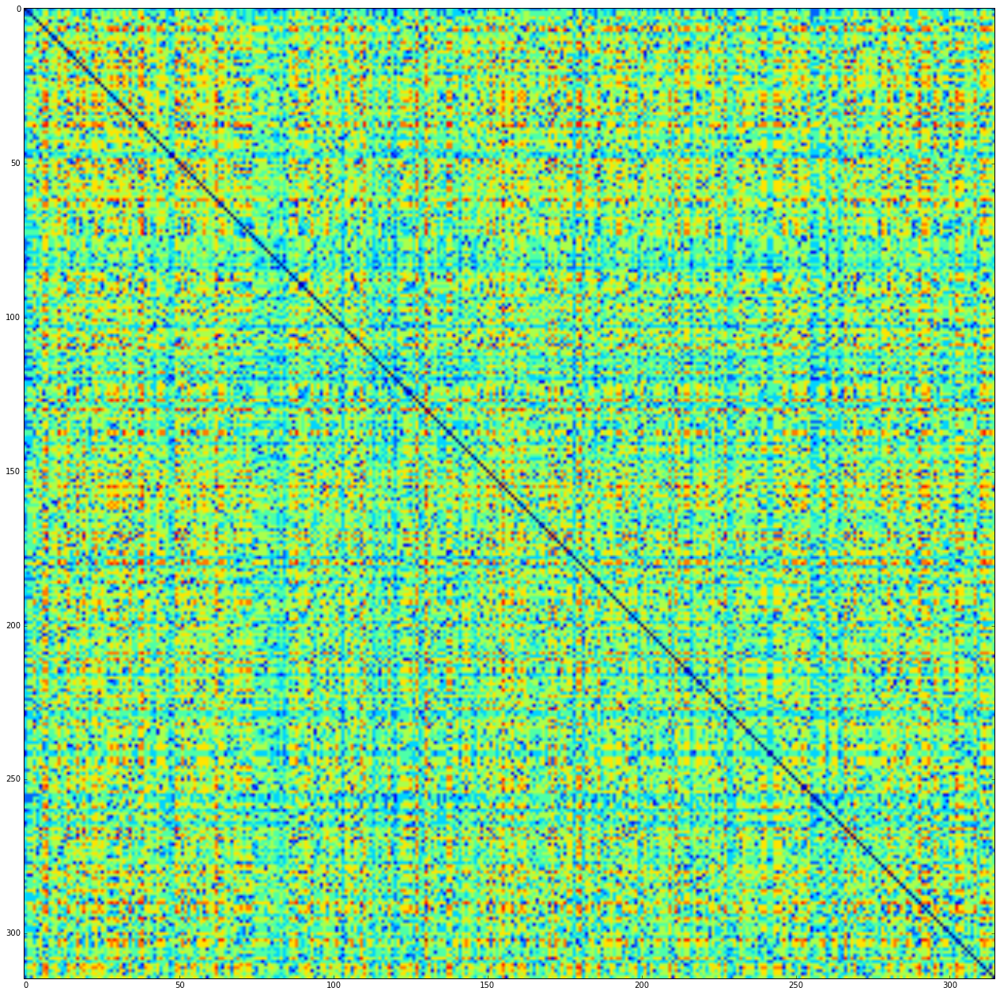

In [3]:
cg_traj = bs.get_cell_group_trajectory(cgs)
pos = nx.spectral_layout(graph)
green_nodes = [(s in cg_traj) for s in graph.nodes()]
green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
nodecolors = [('r' if s else 'g') for s in green_nodes]
edgecolors = [('r' if (s in green_edges or s[::-1] in green_edges) else 'k') for s in graph.edges()]

plt.figure(figsize=(22,22))
nx.draw_networkx(graph, pos=pos, edge_color=edgecolors, node_color=nodecolors, node_size=50, with_labels=False)
plt.show()

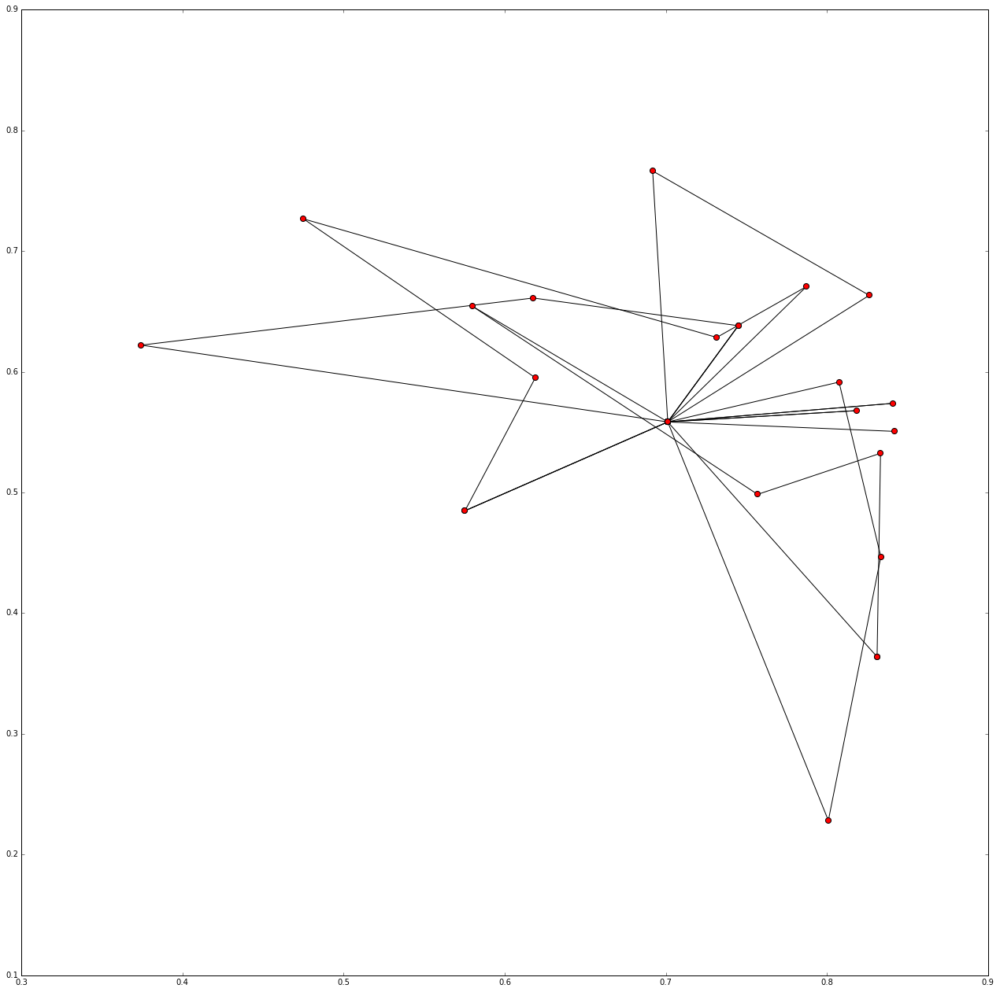

In [79]:
plt.close("all")
global alogf 
top.alogf = './test_grph.log'
with h5.File(bdf, 'r') as f:
    
    bds = f['B_scaled_burung']['0']
    graph = bs.build_graph_from_binned_dataset(bds, 6.0)
    cgs = top.calc_cell_groups_from_binned_data(bds, 6.0)

cg_traj = bs.get_cell_group_trajectory(cgs)
pos = nx.spring_layout(graph)
green_nodes = [(s in cg_traj) for s in graph.nodes()]
green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
nodecolors = [('b' if s else 'g') for s in green_nodes]
edgecolors = [('r' if s in green_edges else 'k') for s in graph.edges()]
plt.figure(figsize=(22,22))
nx.draw_networkx(graph, pos=pos, nodelist=cg_traj, edgelist=zip(cg_traj[:-1], cg_traj[1:]),node_size=50, with_labels=False)
plt.show()

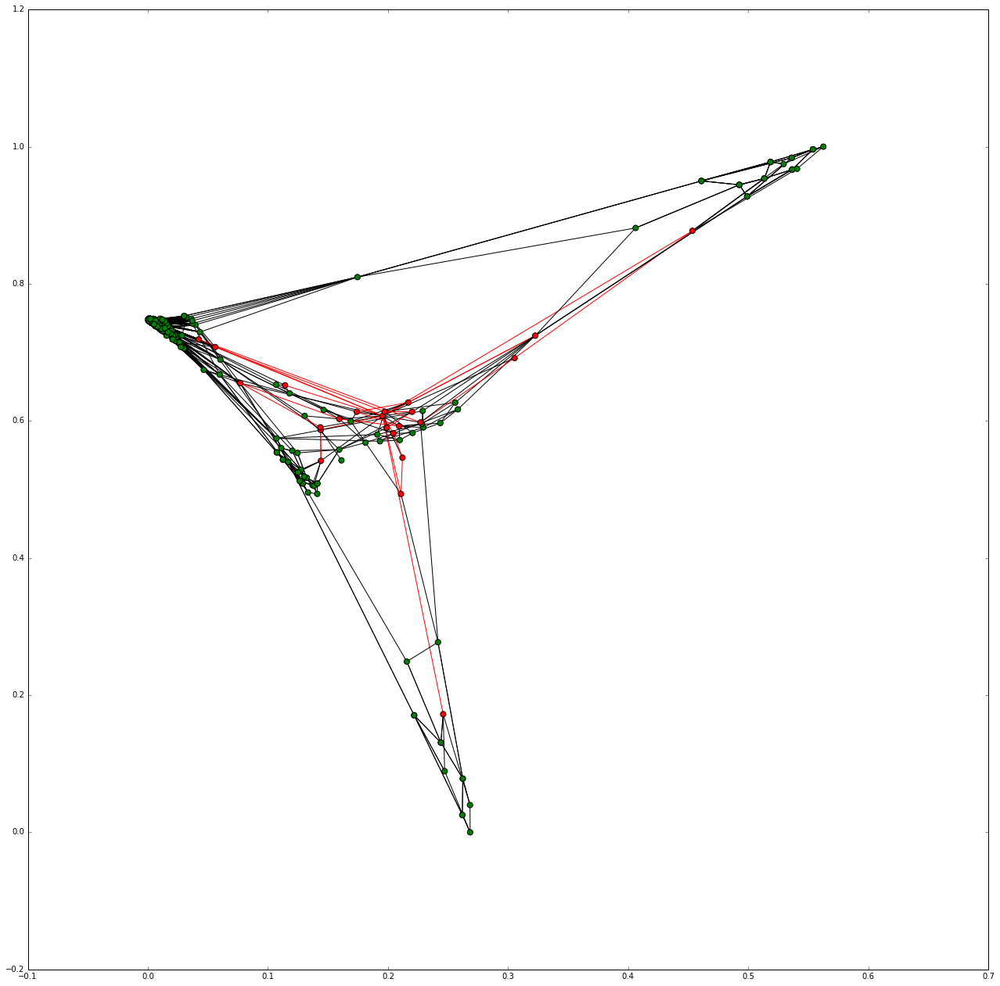

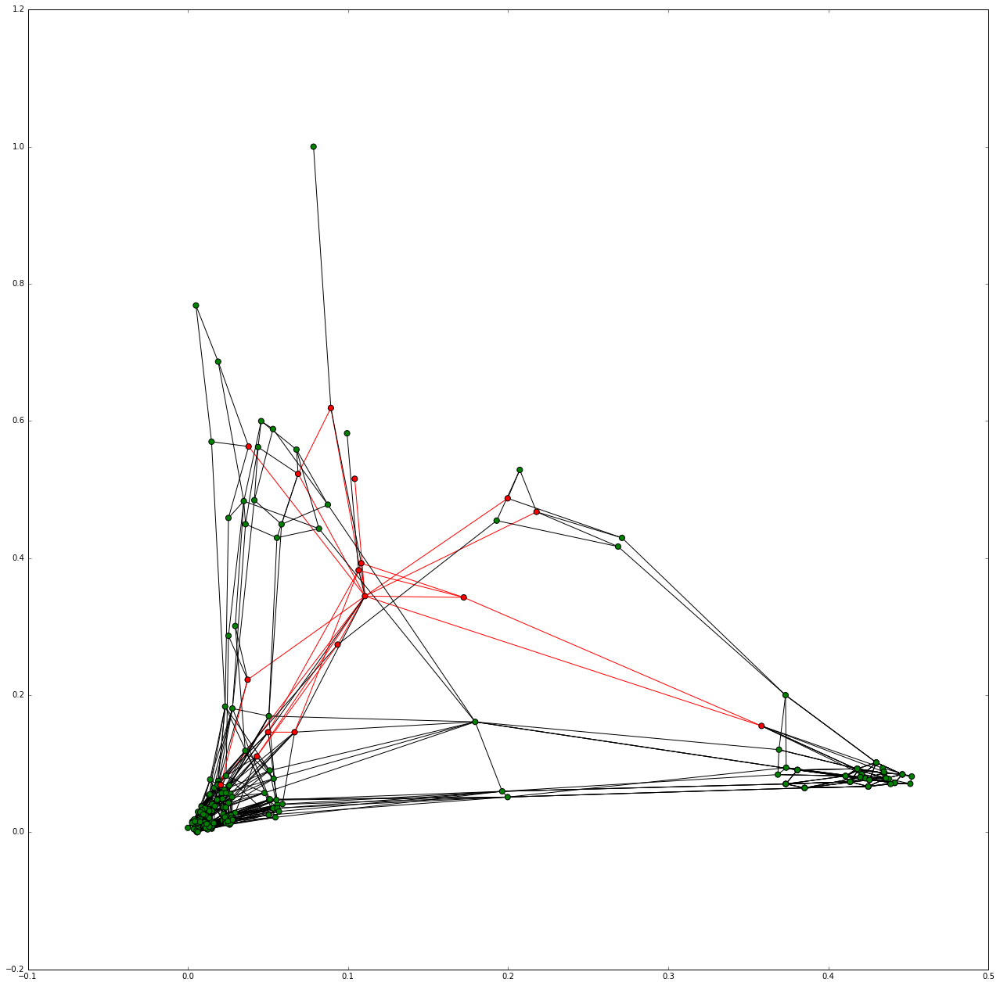

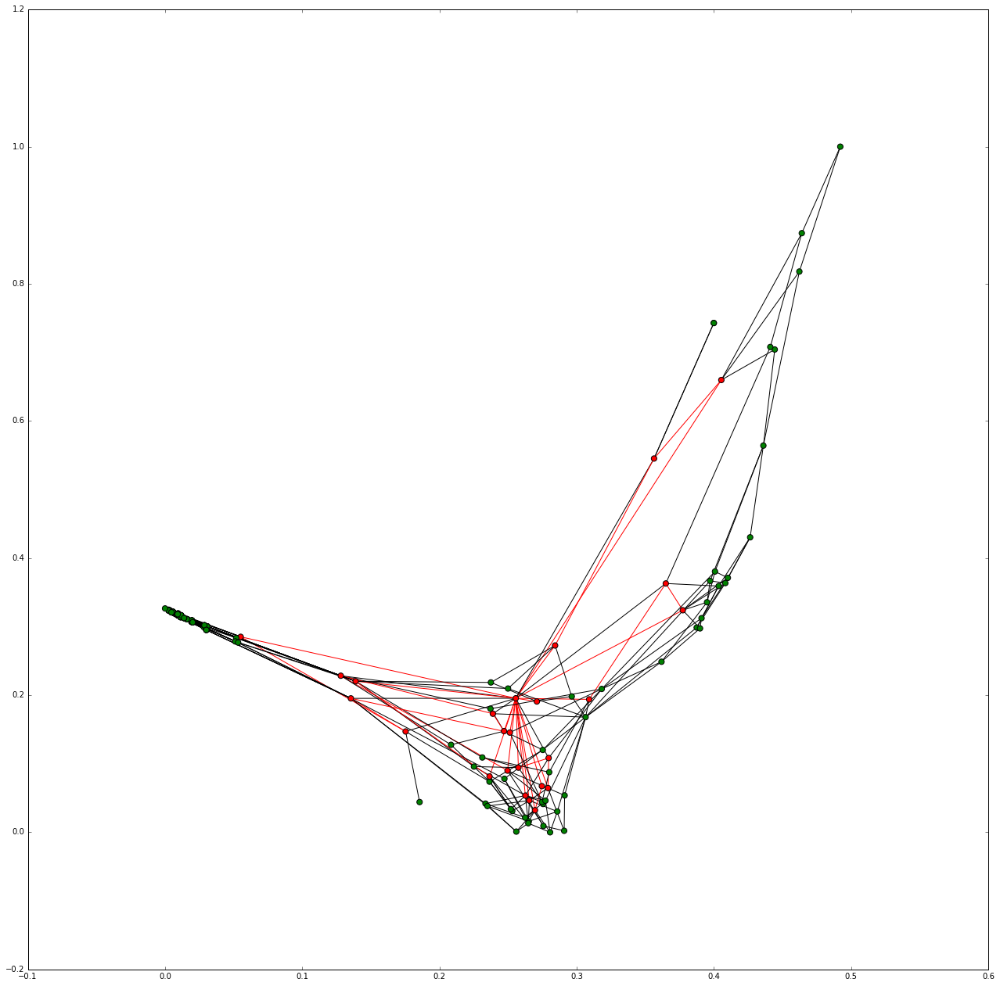

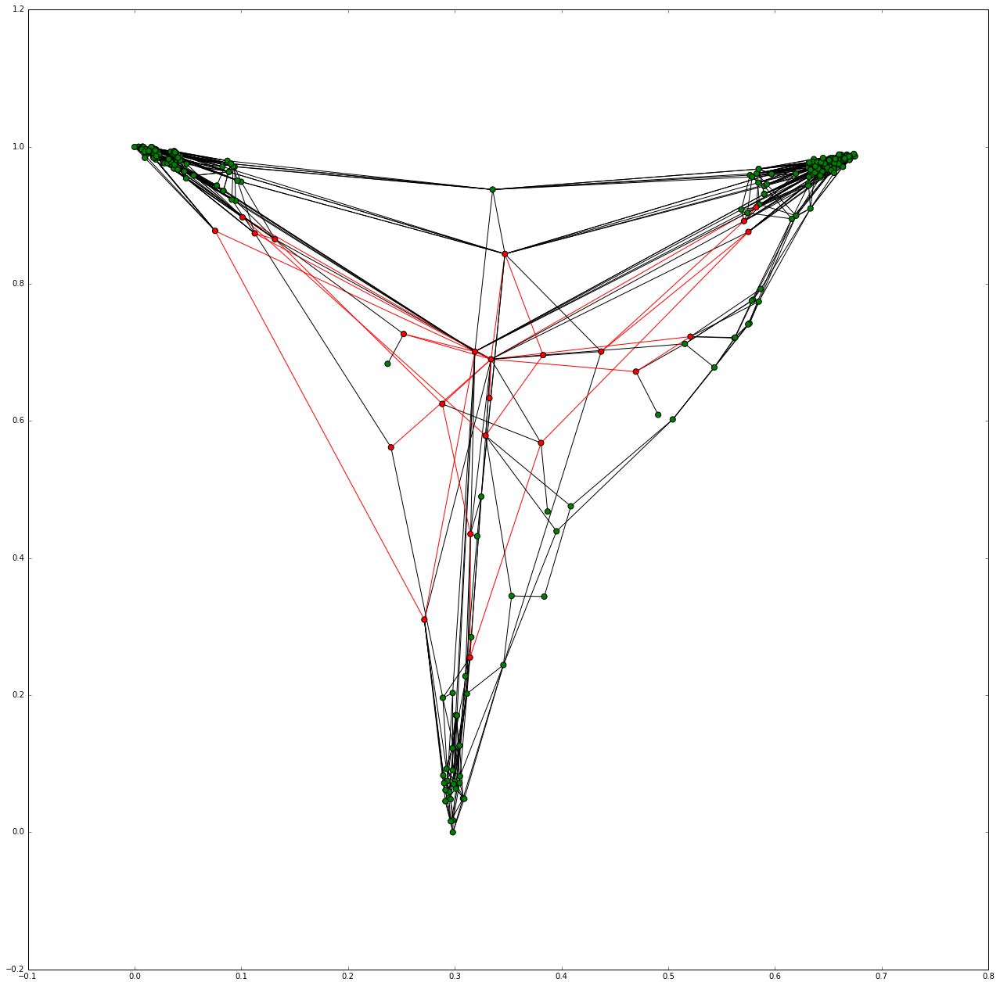

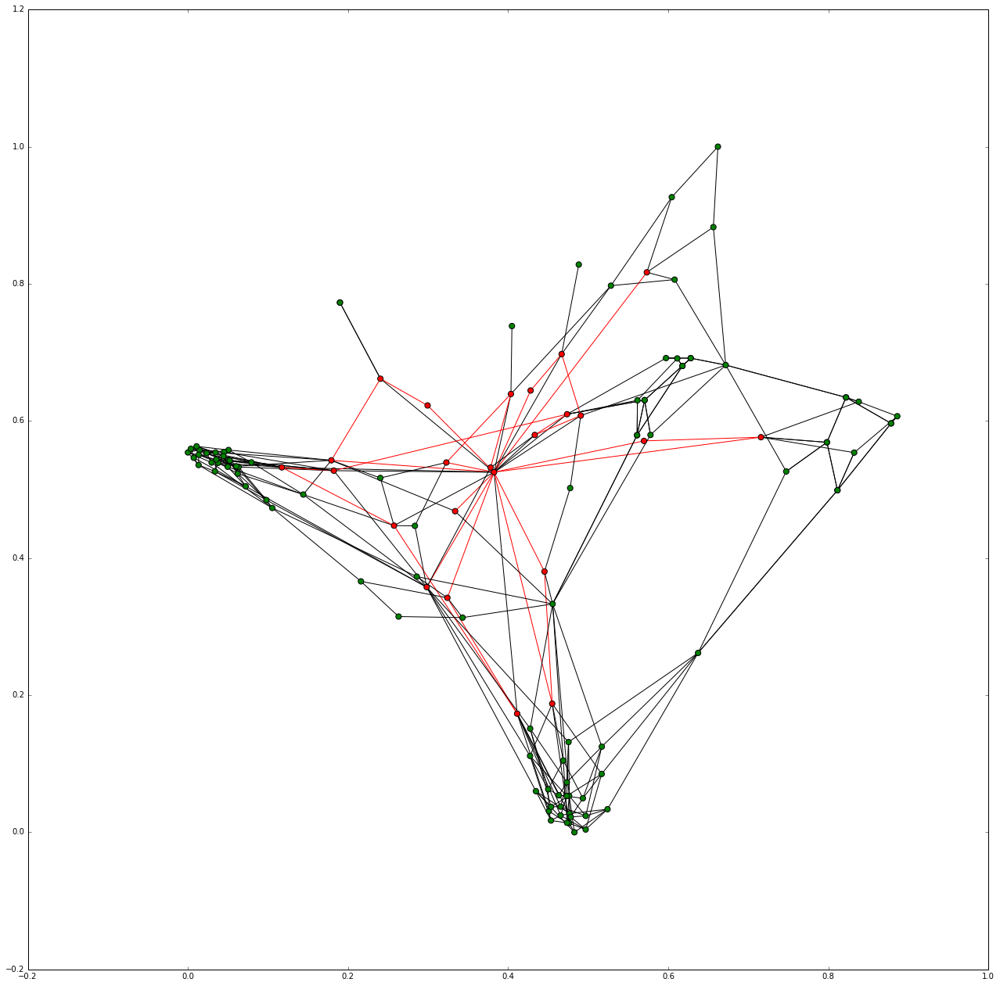

...

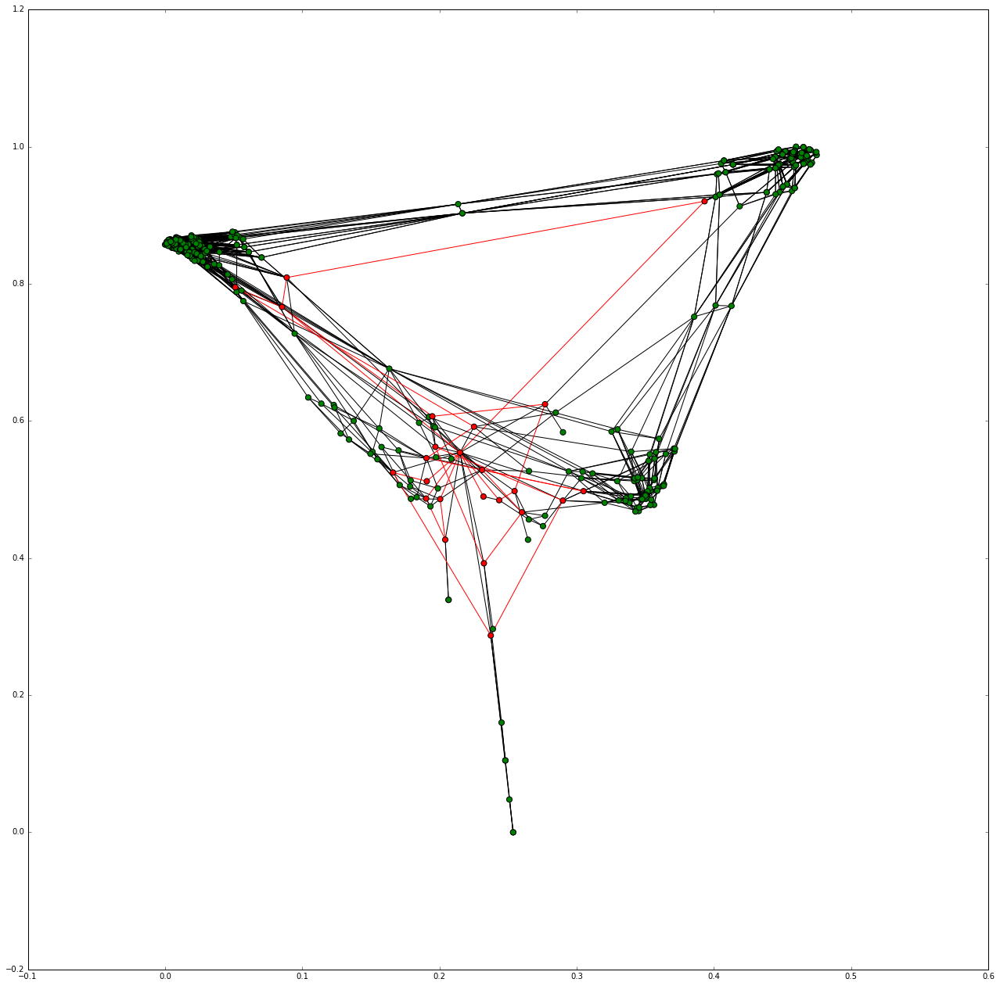

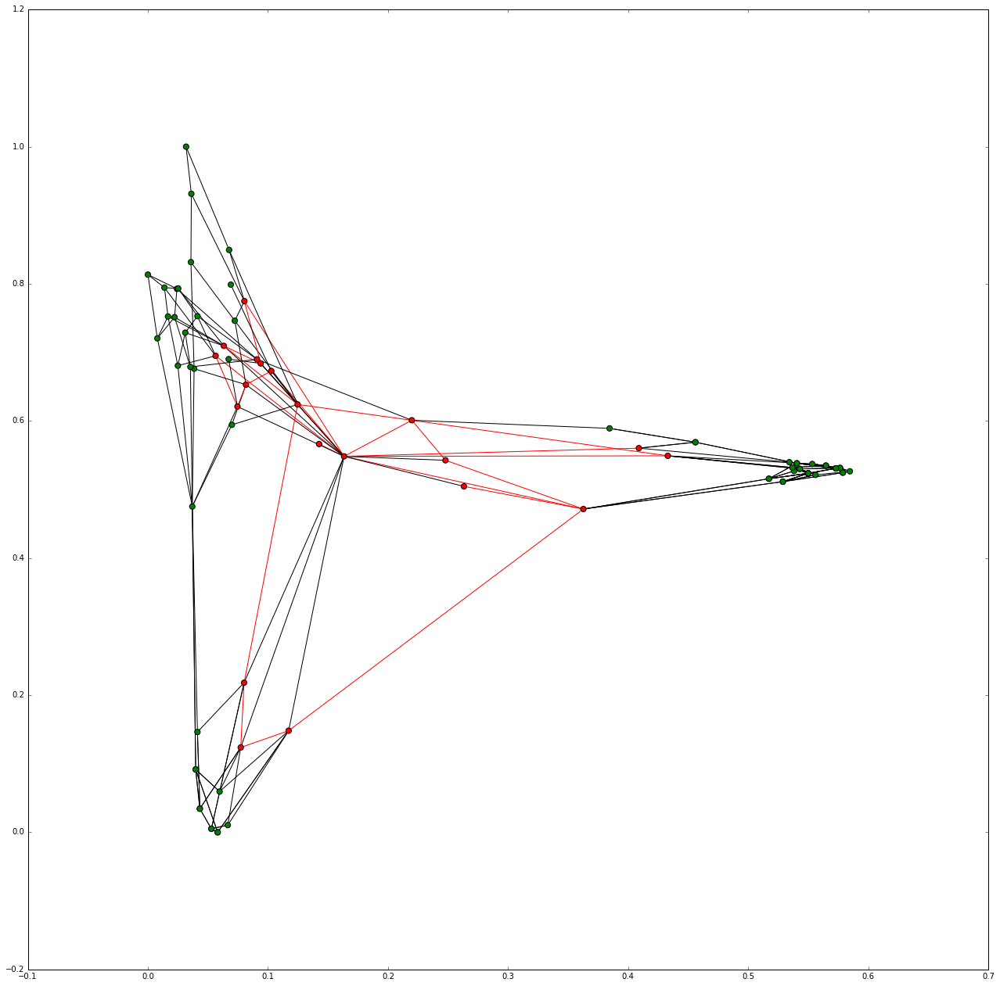

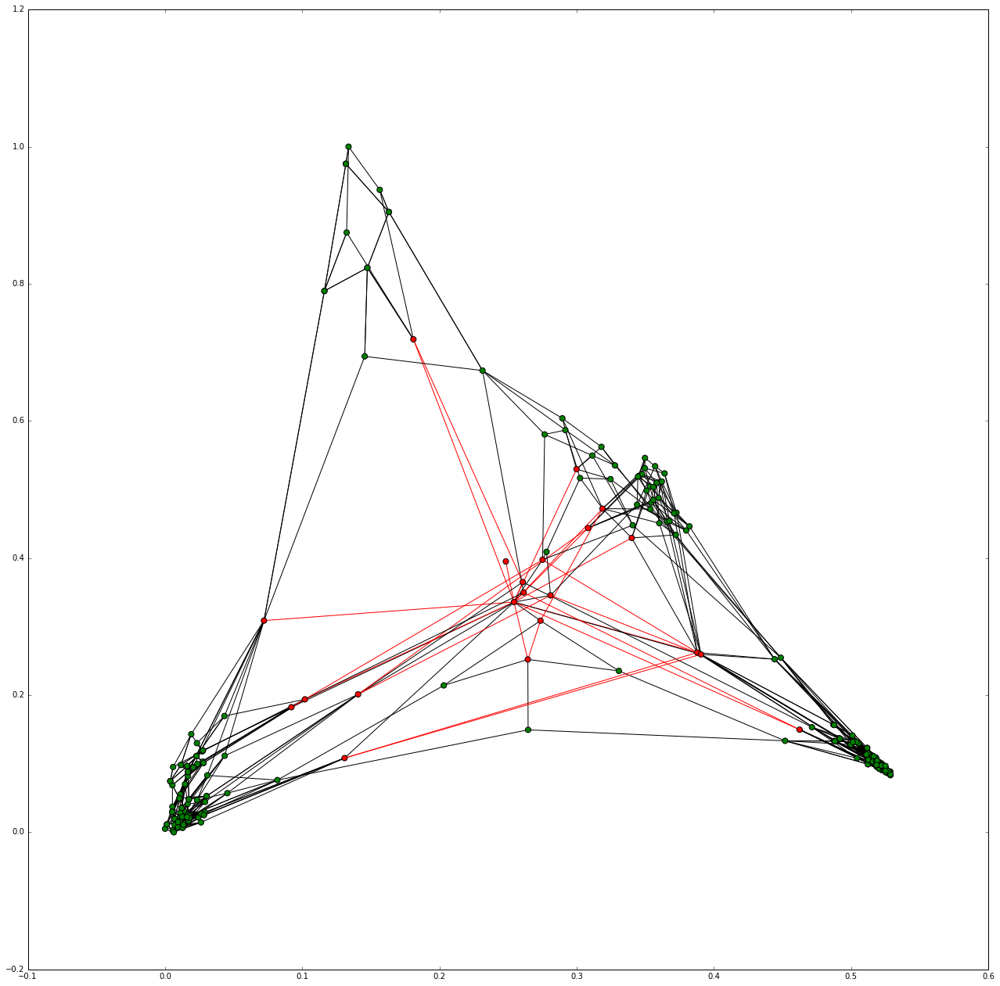

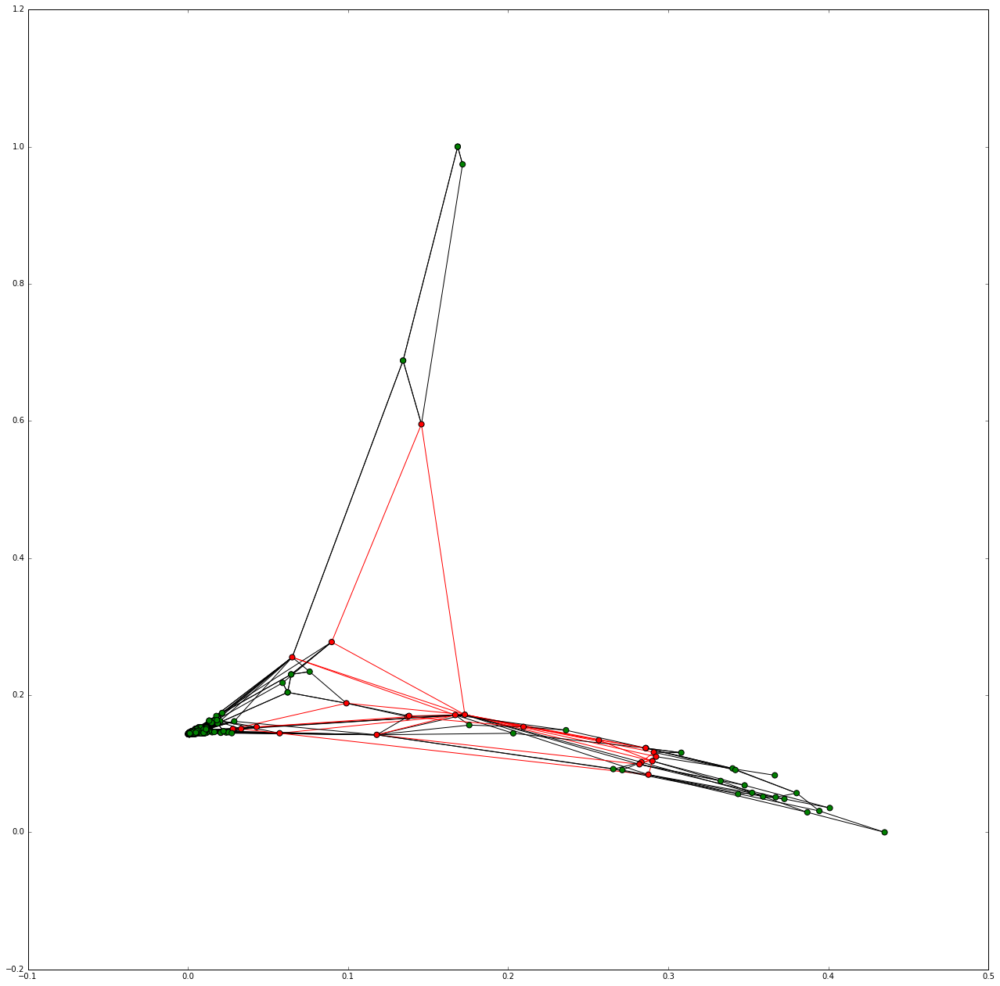

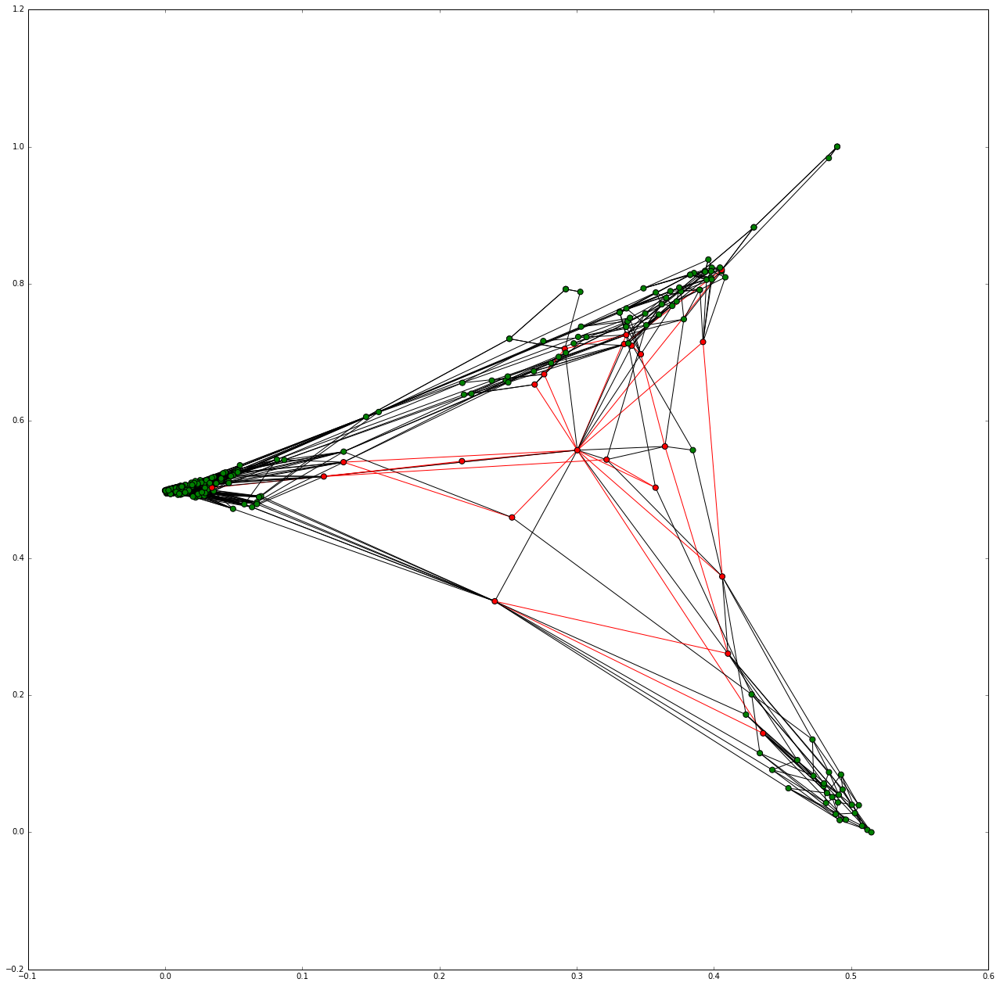

In [80]:
plt.close("all")
global alogf 
top.alogf = './test_grph.log'
stim = 'A_scaled_burung'
thresh = 6.0
with h5.File(bdf, 'r') as f:
    stimdata = f[stim]    
    for trial in stimdata.keys():
        bds = stimdata[trial]
        graph = bs.build_graph_from_binned_dataset(bds, thresh)
        cgs = top.calc_cell_groups_from_binned_data(bds, thresh)

        cg_traj = bs.get_cell_group_trajectory(cgs)
        pos = nx.spectral_layout(graph)
        green_nodes = [(s in cg_traj) for s in graph.nodes()]
        green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
        nodecolors = [('r' if s else 'g') for s in green_nodes]
        edgecolors = [('r' if (s in green_edges or s[::-1] in green_edges) else 'k') for s in graph.edges()]
        plt.figure(figsize=(22,22))
        nx.draw_networkx(graph, pos=pos, node_color=nodecolors, edge_color=edgecolors, node_size=50, with_labels=False)
        save_name='/Users/brad/figs/{}-{}-{}-reconstructedspace.png'.format(stim, trial, thresh)
        plt.savefig(save_name)
        plt.show()
        

In [ ]:
test = [(s in cg_traj) for s in graph.nodes()]

In [ ]:
green_nodes = [(s in cg_traj) for s in graph.nodes()]
nodecolors = [('g' if s else 'r') for s in green_nodes]

In [21]:
green_nodes = [(s in cg_traj) for s in graph.nodes()]
green_edges = [(s, k) for s,k in zip(cg_traj[:-1], cg_traj[1:])]
nodecolors = [('b' if s else 'g') for s in green_nodes]
edgecolors = [('r' if s in green_edges else 'k') for s in graph.edges()]

In [29]:
cg_traj

['',
 '1321',
 '',
 '',
 '',
 '',
 '813',
 '',
 '',
 '8',
 '8',
 '',
 '8',
 '42',
 '',
 '',
 '42',
 '48',
 '842',
 '44245',
 '4',
 '4',
 '26',
 '',
 '',
 '30',
 '',
 '6',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '6',
 '',
 '',
 '62023',
 '613141933',
 '48283342',
 '61337',
 '6202734',
 '62642',
 '20',
 '',
 '',
 '',
 '',
 '',
 '8',
 '',
 '',
 '61319',
 '33',
 '61327',
 '',
 '',
 '6',
 '',
 '131829',
 '142028',
 '5203345',
 '13',
 '6102030',
 '27',
 '162730',
 '',
 '10',
 '10143033',
 '2730',
 '20',
 '13141929',
 '2033',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '6',
 '',
 '27',
 '410',
 '4182733',
 '1530',
 '2125',
 '27',
 '442',
 '',
 '14',
 '81019',
 '14',
 '',
 '27',
 '',
 '',
 '',
 '',
 '',
 '6827',
 '',
 '8',
 '131420',
 '682042',
 '42',
 '2542',
 '16',
 '82642',
 '192142',
 '41642',
 '',
 '842',
 '',
 '48',
 '2125',
 '',
 '425',
 '',
 '',
 '13',
 '',
 '',
 '',
 '']

In [4]:
thresh = 6.0
savepath = '/Users/brad/figs/'
dfunc_params = {'c':1, 'tau':1}


In [21]:
n = len(graph.nodes())
n

503

In [7]:
hmds_params = {'n':n, 'eps':1e-4, 'eta':0.2, 'maxiter':2000, 'maxtrial':10, 'verbose':1}

In [12]:
bs.make_hyperbolic_embeds(bdf, thresh, savepath, dfunc_params, hmds_params)

KeyboardInterrupt: 